In [13]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy import signal

%matplotlib inline

In [2]:
fast = cv2.FastFeatureDetector_create()
orb = cv2.ORB_create()


# function for keypoints and descriptors calculation
def detect_keypoints_and_calculate_descriptors(img):
    # img - numpy 2d array (grayscale image)
    img_blur = cv2.GaussianBlur(img, (31, 31), 3.0)

    # keypoints
    kp_arr = []

    cv_kp_arr = fast.detect(img_blur, None)

    # descriptors
    cv_kp_arr, cv_descr_arr = orb.compute(img_blur, cv_kp_arr)

    for i in range(len(cv_kp_arr)):
        kp_arr.append((
            int(cv_kp_arr[i].pt[0]),
            int(cv_kp_arr[i].pt[1])
        ))

    # kp_arr is array of 2d coordinates-tuples, example:
    # [(x0, y0), (x1, y1), ...]
    # xN, yN - integers
    #
    # cv_descr_arr is array of descriptors (arrays), example:
    # [[v00, v01, v02, ...], [v10, v11, v12, ...], ...]
    # vNM - floats
    #
    return kp_arr, cv_descr_arr



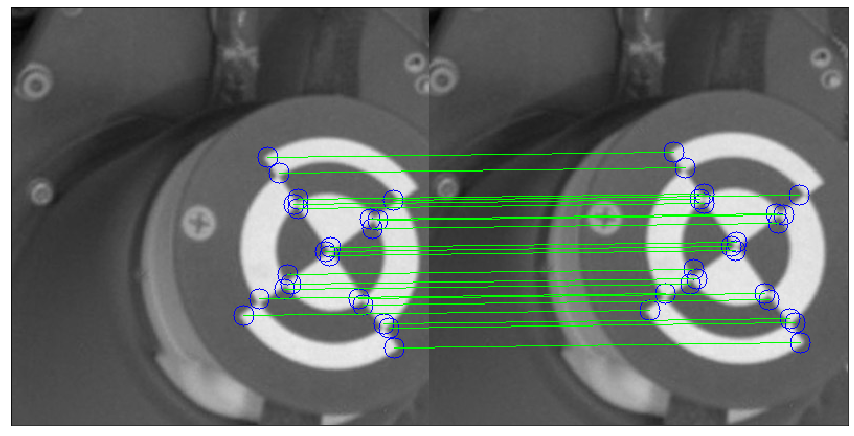

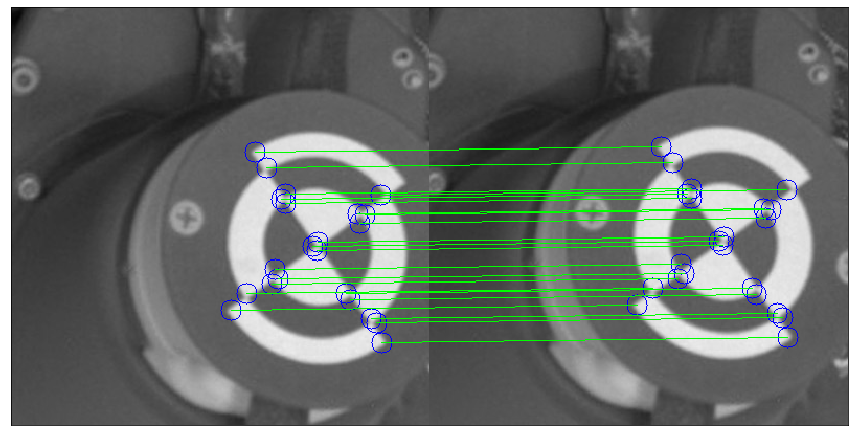

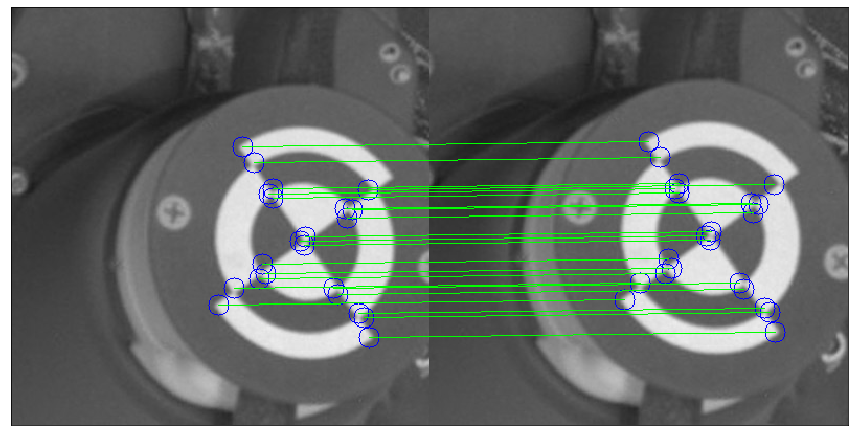

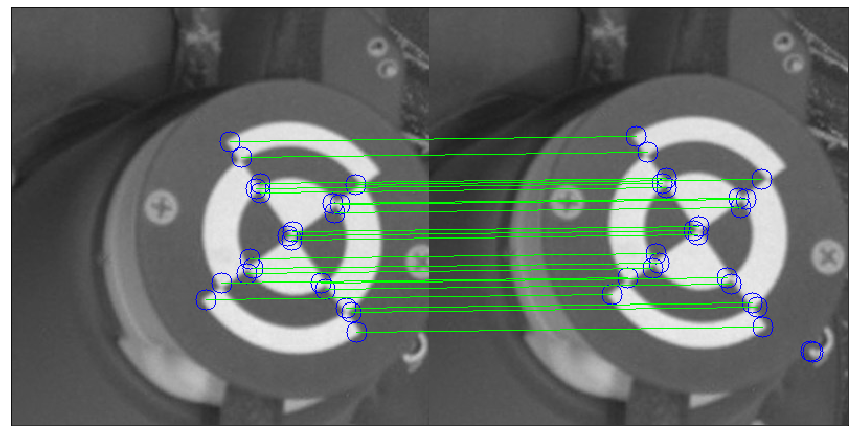

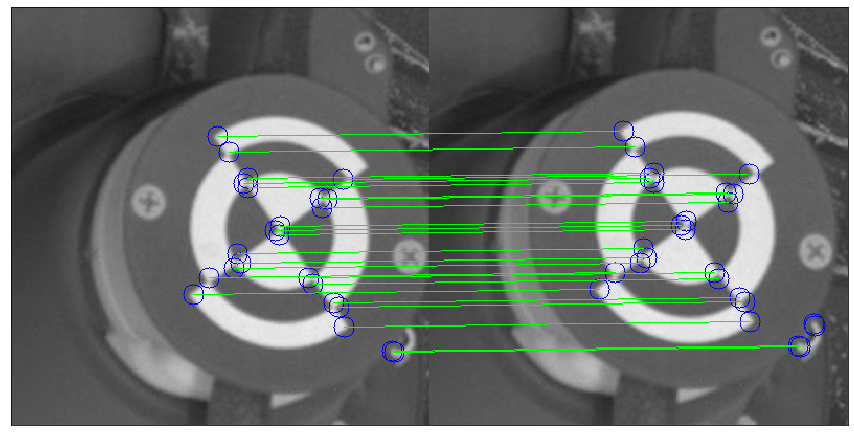

...

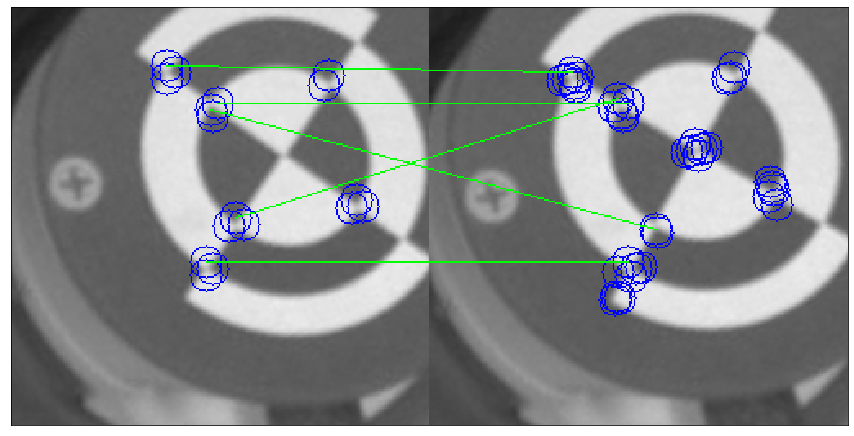

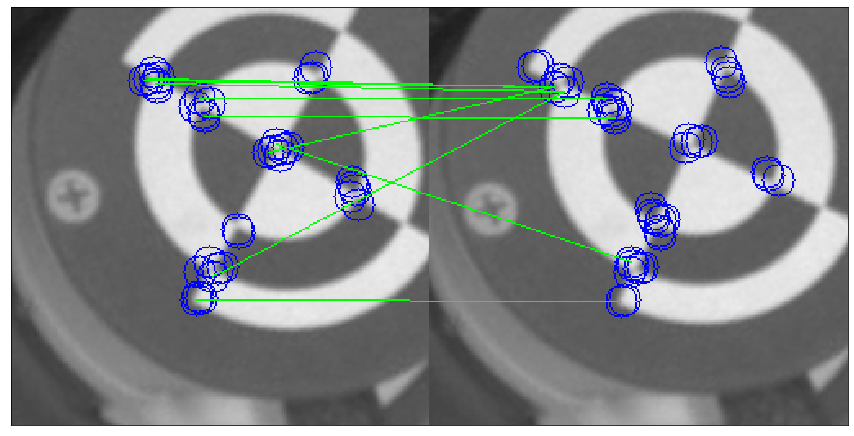

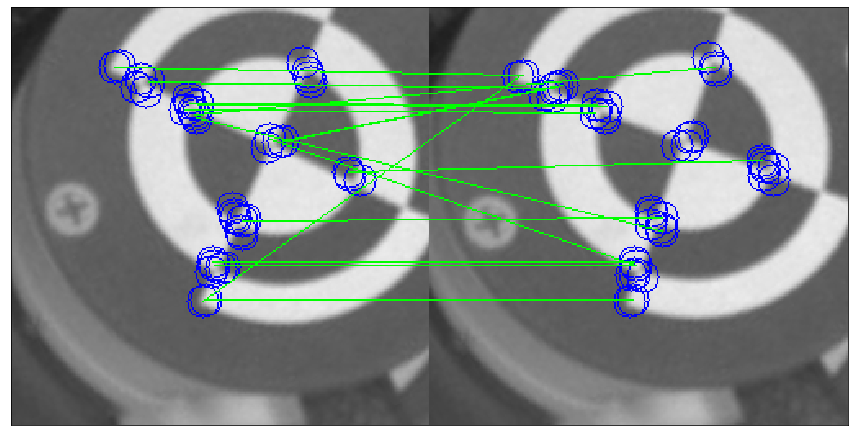

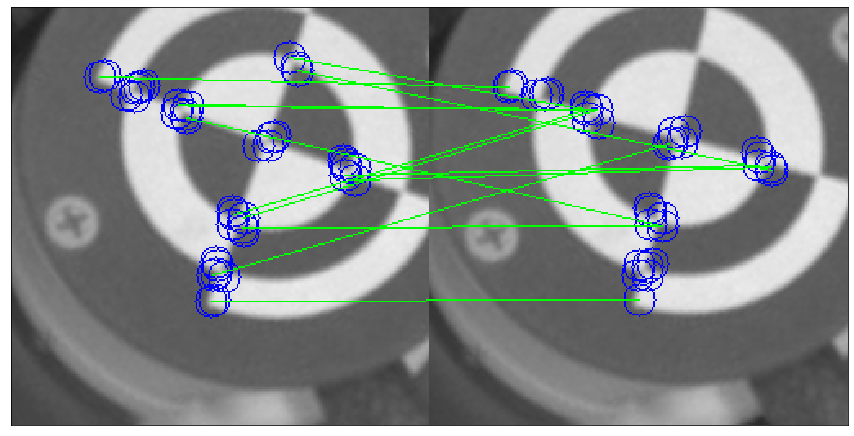

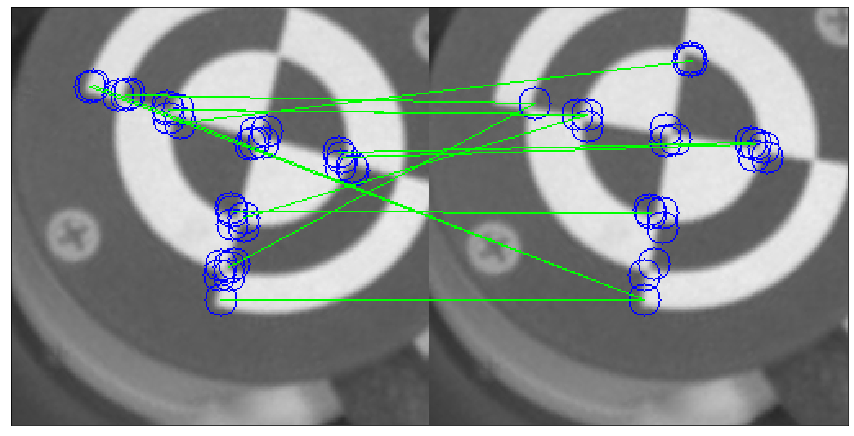

In [3]:
img_in_path = './ucu-cv-code/res/tracking/'


def match_brute_force(descr_arr0, descr_arr1):
    bf = cv2.BFMatcher()
    # return 2 matches for keypoint
    matches = bf.knnMatch(descr_arr0, descr_arr1, k=2)

    matches_arr = []
    for match_a, match_b in matches:
        # mark match good if 2nd match has bigger distance
        # (filtering similar keypoints)
        if match_a.distance < 0.75 * match_b.distance:
            matches_arr.append((
                match_a.queryIdx,
                match_a.trainIdx
            ))

    return matches_arr


for test_name in ['translation_', 'translation_noise_', 'rotation_2_', 'rotation_5_']:
    for frame_idx in range(9):
        # read two frames
        img0_fpath = img_in_path + test_name + str(frame_idx) + '.png'
        img0 = cv2.imread(img0_fpath, cv2.IMREAD_GRAYSCALE)

        img1_fpath = img_in_path + test_name + str(frame_idx+1) + '.png'
        img1 = cv2.imread(img1_fpath, cv2.IMREAD_GRAYSCALE)

        rows = img0.shape[0]
        cols = img0.shape[1]

        # detect keypoints and calculate descriptors
        kp0, descr0 = detect_keypoints_and_calculate_descriptors(img0.copy())
        kp1, descr1 = detect_keypoints_and_calculate_descriptors(img1.copy())

        # match
        match_arr = match_brute_force(descr0, descr1)

        # draw on one image
        img_both = np.zeros((rows, cols*2), np.uint8)
        img_both[:, 0:cols] = img0
        img_both[:, cols:cols*2] = img1
        img_both_bgr = cv2.cvtColor(img_both, cv2.COLOR_GRAY2BGR)

        # keypoints as red circles
        for i in range(len(kp0)):
            kp = kp0[i]
            x = kp[0]
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        for i in range(len(kp1)):
            kp = kp1[i]
            x = kp[0] + cols
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        # matches as green lines
        for pair in match_arr:
            x0 = kp0[pair[0]][0]
            y0 = kp0[pair[0]][1]
            x1 = kp1[pair[1]][0] + cols
            y1 = kp1[pair[1]][1]
            cv2.line(img_both_bgr, (x0, y0), (x1, y1), (0, 255, 0))

        # show image and wait for key press
#         cv2.imshow('img_both', img_both_bgr)
#         cv2.waitKey(-1)
        
        plt.rcParams['figure.figsize'] = [15, 10]
        plt.imshow(img_both_bgr, cmap='gray')
        plt.xticks([]), plt.yticks([])
        plt.show()



# My code

FAST

https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_fast/py_fast.html

BRIEF

https://gilscvblog.com/2013/09/19/a-tutorial-on-binary-descriptors-part-2-the-brief-descriptor/

In [11]:
def gaussian_kernel(l=5, sig=0.5):
    ax = np.arange(-l // 2 + 1., l // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)
 
    
def gaussian_blur(img, kernel_sz, sigma):
    # img_blur = cv2.GaussianBlur(img, kernel_sz, sigma)
    kernel = gaussian_kernel(kernel_sz[0], sigma)

    filtered = signal.convolve2d(img, kernel, mode='same', boundary = 'symm', fillvalue=0)
    
    return filtered

def circle(row, col):
    point1 = (row+3, col)
    point3 = (row+3, col-1)
    point5 = (row, col+3)
    point7 = (row-1, col+3)
    point9 = (row-3, col)
    point11 = (row-3, col-1)
    point13 = (row, col-3)
    point15 = (row-1, col-3)
    
    return [point1, point3, point5, point7, point9, point11, point13, point15];


def is_corner(image, row, col, patch_boundaries, threshold):
    intensity = int(image[row][col])
    row1, col1 = patch_boundaries[0]
    row5, col5 = patch_boundaries[2]
    row9, col9 = patch_boundaries[4]
    row13, col13 = patch_boundaries[6]
    
    intensity1 = int(image[row1][col1])
    intensity5 = int(image[row5][col5])
    intensity9 = int(image[row9][col9])
    intensity13 = int(image[row13][col13])
    
    #print(intensity, intensity1, intensity5, intensity9, intensity13)
    
    is_pixel_corner = False
    # if darker then 2 other should be darker
    if (intensity1 - intensity) > threshold:
        if (intensity5 - intensity) > threshold and (intensity13 - intensity) > threshold:
            is_pixel_corner = True     
    # if brighter then 2 other should be brighter 
    if (intensity - intensity1) > threshold:
        if (intensity - intensity5) > threshold and (intensity - intensity13) > threshold:
            is_pixel_corner = True
    # do the same for opposite side  
    if (intensity9 - intensity) > threshold:
        if (intensity5 - intensity) > threshold and (intensity13 - intensity) > threshold:
            is_pixel_corner = True     
    if (intensity - intensity9) > threshold:
        if (intensity - intensity5) > threshold and (intensity - intensity13) > threshold:
            is_pixel_corner = True

    return is_pixel_corner


def find_keypoints_candidates(image, threshold=7):
    corners = []
    for row in range(0, image.shape[0], 1):
        for col in range(0, image.shape[1], 1):
            patch_boundaries = circle(row, col)
            
            break_limit = False
            for item in patch_boundaries:
                if item[0] >= image.shape[0] or item[1] >= image.shape[1]:
                    break_limit= True
                    break
                if item[0] < 0 or item[1] < 0:
                    break_limit= True
                    break
            if break_limit:
                continue        
            
            if(is_corner(image, row, col, patch_boundaries, threshold)):
                corners.append((col, row))

    return corners

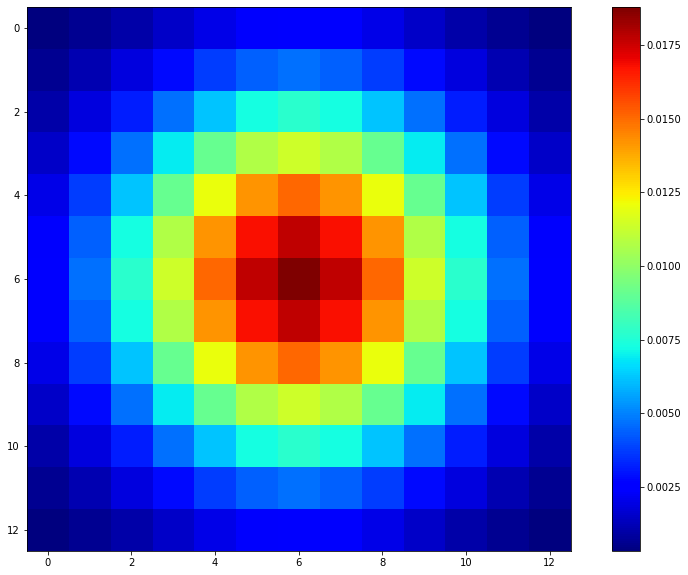

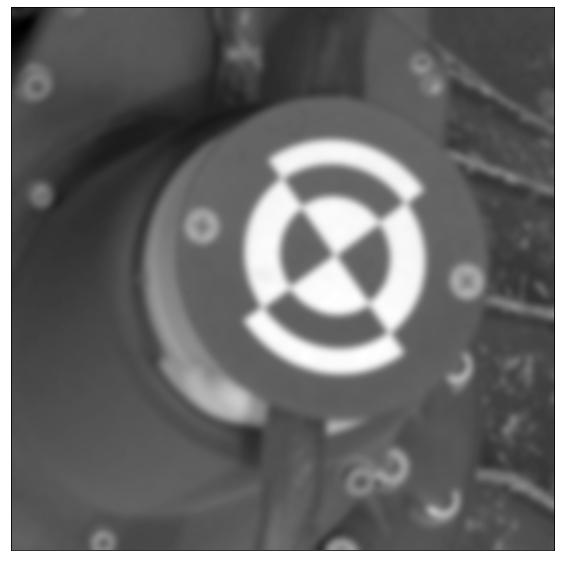

In [16]:
gaussian_kernel_array = gaussian_kernel(13,3)
 
plt.imshow(gaussian_kernel_array, cmap=plt.get_cmap('jet'), interpolation='nearest')
plt.colorbar()
plt.show()

img = cv2.imread('ucu-cv-code/res/marker_cut_rgb_512.png')
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

blured = gaussian_blur(img, (13,13),3)

plt.imshow(blured, cmap = 'gray', interpolation = 'bicubic')
plt.xticks([]), plt.yticks([])
plt.show()

In [5]:
# descriptors
number_of_points = 100

def get_patch(image, point):
    col1 = point[0] - 16
    col2 = point[0] + 16
    row1 = point[1] - 16
    row2 = point[1] + 16
    
    # there is not enought space 
    if col1<0 or row1<0 or col2>image.shape[1] or row2>image.shape[1]:
        return np.zeros((32,32))
    
    patch = image[row1:row2, col1:col2]
    
    return patch

def get_binary_features(features):
    binary_features = []
    for feature in features:
        binary_features.append(feature[0]>feature[1])
        
    return binary_features

def compute_descriptors(img, kp_arr):
    number_of_points = 100
    
    descr_arr = []
    for corner in kp_arr:
        patch = get_patch(img, corner)
        # select random points
        elements = np.random.choice(patch.size, number_of_points, replace=False) # id
        # pairs of random points
        features = np.take(patch.flatten(), elements).reshape(int(number_of_points / 2), 2) # intensity
        binary_feature = get_binary_features(features) # binary string
        descr_arr.append((corner, patch, elements, features, binary_feature))
    
    return np.array(descr_arr)

def match_brute_force(descr_arr1, descr_arr2):
    matching = []
    
    for descr1 in descr_arr1:
        binary_string1 = descr1[4]
        
        related_pair_distance = 512
        related_pair = None
        
        for descr2 in descr_arr2:
            features2 = np.take(descr2[1].flatten(), descr1[2]).reshape(int(number_of_points / 2), 2) # intensity
            binary_string2 = get_binary_features(features2)

            new_hamming_distance = np.sum(np.logical_xor(binary_string1, binary_string2))
            
            if new_hamming_distance < related_pair_distance:
                related_pair_distance = new_hamming_distance
                related_pair = descr2[0]

        matching.append((descr1[0], related_pair))
        
    return matching 

def compare_patches(patch1, patch2, number_of_points = 100):
    #features1 = np.random.choice(patch1.flatten(), size=200, replace=False).reshape(100, 2)
    #features2 = np.random.choice(patch2.flatten(), size=200, replace=False).reshape(100, 2)
    elements = np.random.choice(patch1.size, number_of_points, replace=False)
    
    features1 = np.take(patch1.flatten(), elements).reshape(int(number_of_points / 2), 2)
    features2 = np.take(patch2.flatten(), elements).reshape(int(number_of_points / 2), 2)
    
    binary_features1 = get_binary_features(features1)
    binary_features2 = get_binary_features(features2)
    
    hamming_distance = np.sum(np.logical_xor(binary_features1, binary_features2))
    
    return hamming_distance

def get_matching(img1, img2):
    matching = []
    
    corners1 = find_keypoints_candidates(img1)
    corners2 = find_keypoints_candidates(img2)
    
    for corner1 in corners1:
        patch1 = get_patch(image1, corner1)

        related_pair_distance = 512
        related_pair = None
        for corner2 in corners2:
            patch2 = get_patch(image2, corner2) 

            new_hamming_distance = compare_patches(patch1, patch2)
            
            if new_hamming_distance < related_pair_distance:
                related_pair_distance = new_hamming_distance
                related_pair = corner2

        matching.append((corner1, related_pair))
        
    return matching 

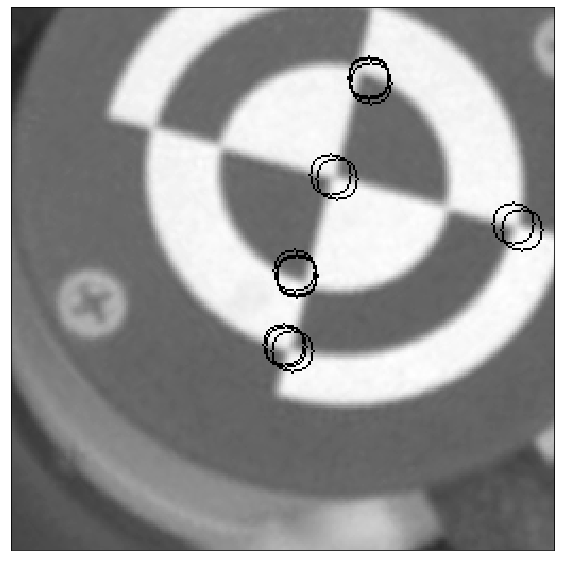

(13, 5)
13


In [6]:
img_src = 'ucu-cv-code/res/marker_cut_rgb_512.png'
img_src = 'ucu-cv-code/res/tracking/rotation_5_8.png'
image = cv2.imread(img_src, cv2.IMREAD_GRAYSCALE)
img_blur = cv2.GaussianBlur(image, (31, 31), 3.0)

corners = find_keypoints_candidates(img_blur, 7)
for corner in corners:
    cv2.circle(image, corner, 10, (0, 0, 255))
        
plt.imshow(image, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.show()

descr_arr = compute_descriptors(img_blur, corners)
print(descr_arr.shape)
print(len(corners))

In [7]:
corners1 = find_keypoints_candidates(img_blur)
descr_arr1 = compute_descriptors(img_blur, corners1)

corners2 = find_keypoints_candidates(img_blur)
descr_arr2 = compute_descriptors(img_blur, corners2)

matching = match_brute_force(descr_arr1, descr_arr2)

matching

[((168, 33), (168, 33)),
 ((168, 34), (168, 34)),
 ((169, 36), (169, 36)),
 ((150, 79), (150, 79)),
 ((153, 81), (153, 81)),
 ((236, 102), (236, 102)),
 ((240, 105), (240, 105)),
 ((133, 124), (133, 124)),
 ((134, 126), (134, 126)),
 ((134, 127), (134, 127)),
 ((128, 159), (128, 159)),
 ((129, 160), (129, 160)),
 ((132, 162), (153, 81))]

In [8]:
img_src1 = 'ucu-cv-code/res/marker_cut_rgb_512.png'
image1 = cv2.imread(img_src1, cv2.IMREAD_GRAYSCALE)
img1 = cv2.GaussianBlur(image1, (31, 31), 3.0)

img_src2 = 'ucu-cv-code/res/tracking/rotation_2_0.png'
image2 = cv2.imread(img_src2, cv2.IMREAD_GRAYSCALE)
img2 = cv2.GaussianBlur(image2, (31, 31), 3.0)

matching = np.array(get_matching(img1, img2))

## Final result: control the number of key points be tweaking threshold

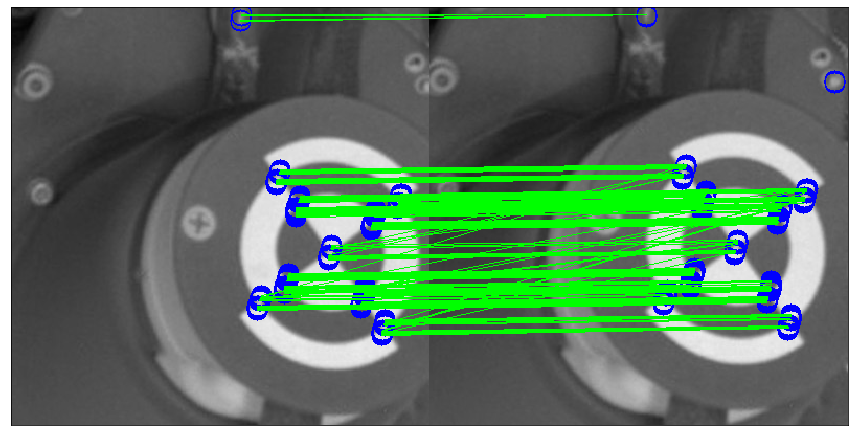

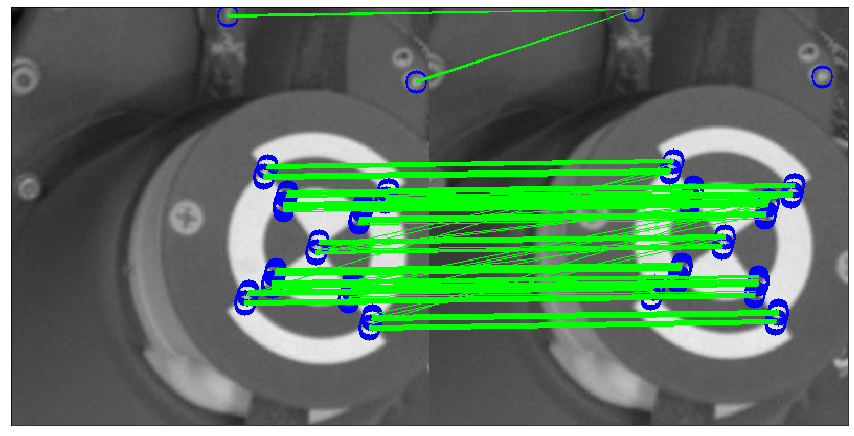

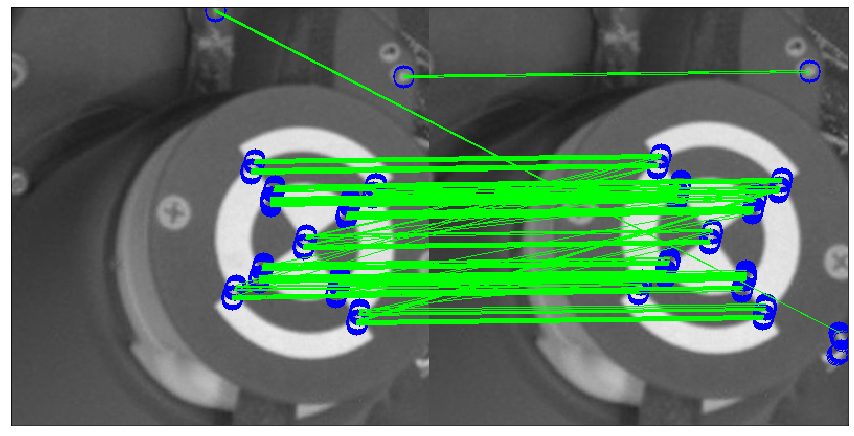

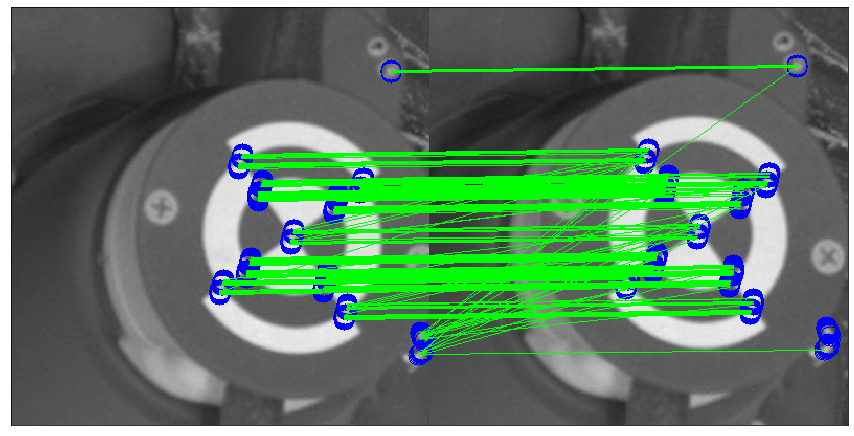

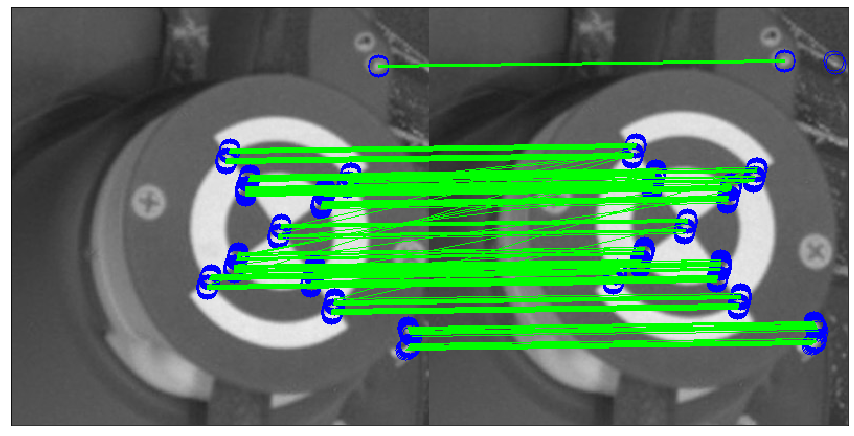

...

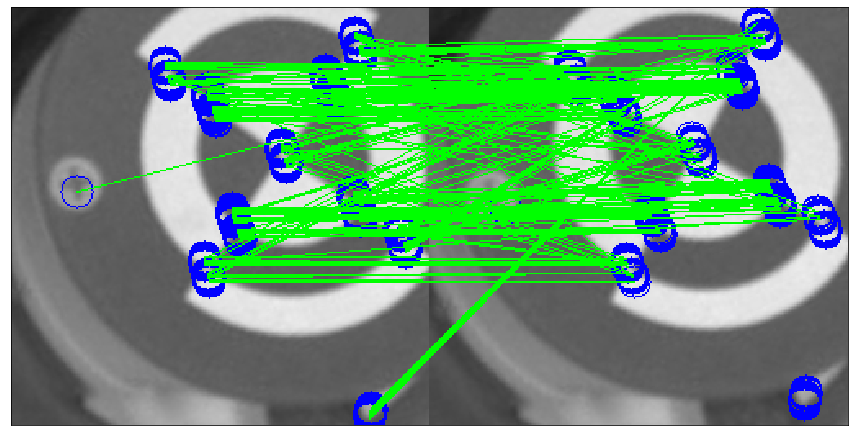

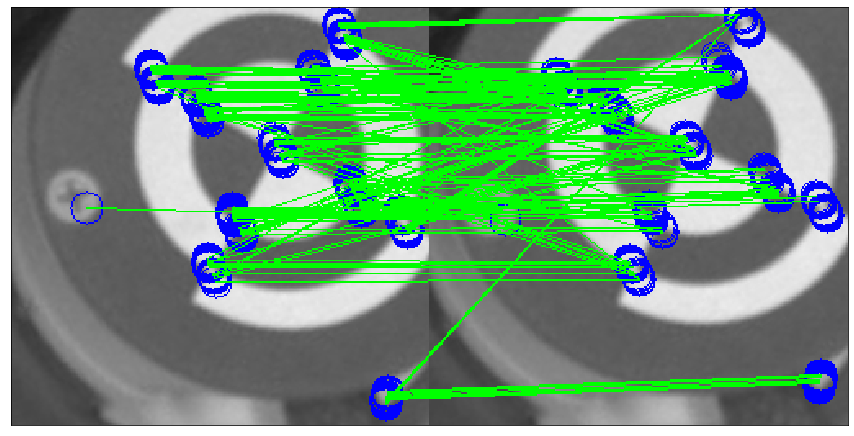

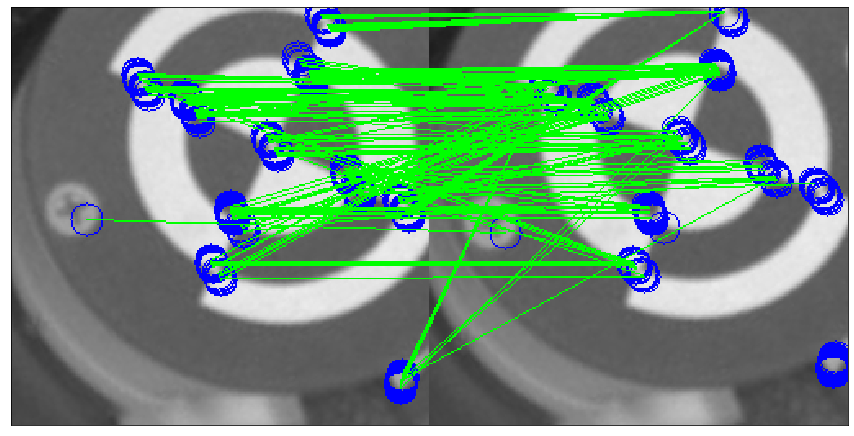

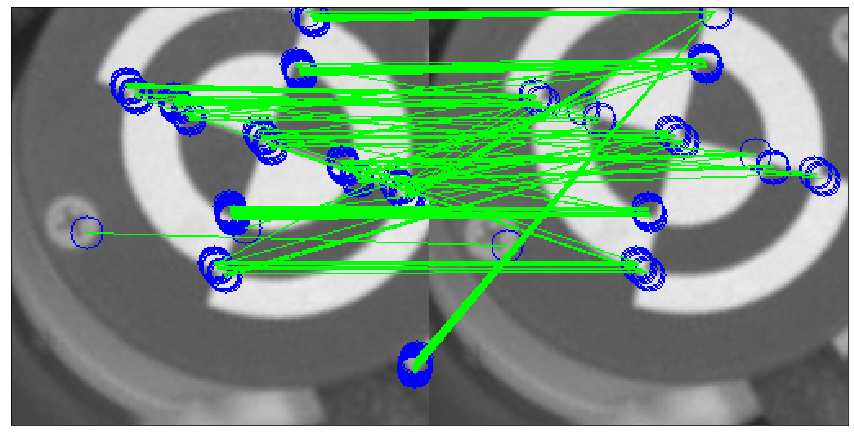

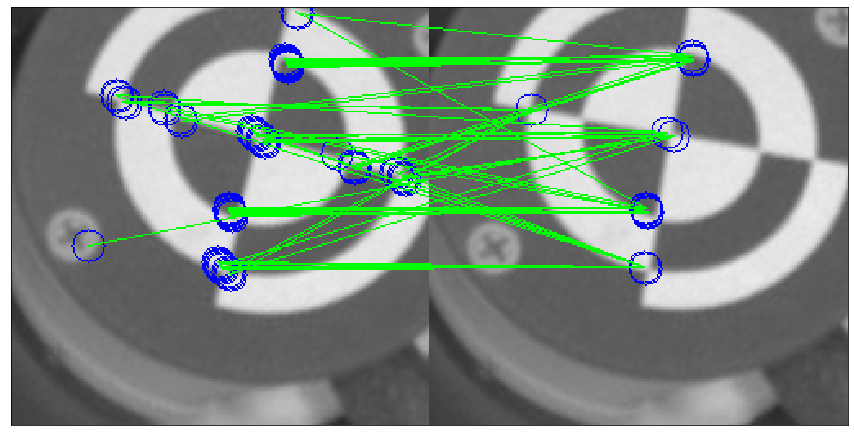

In [14]:
img_in_path = './ucu-cv-code/res/tracking/'


# function for keypoints and descriptors calculation
def detect_keypoints_and_calculate_descriptors(img):
    # img - numpy 2d array (grayscale image)
    img_blur = gaussian_blur(img, (31,31), 3.0)

    # keypoints
    kp_arr = find_keypoints_candidates(img_blur, 5)
    # kp_arr is array of 2d coordinates-tuples, example:
    # [(x0, y0), (x1, y1), ...]
    # xN, yN - integers

    # descriptors
    descr_arr = compute_descriptors(img_blur, kp_arr)
    # cv_descr_arr is array of descriptors (arrays), example:
    # [[v00, v01, v02, ...], [v10, v11, v12, ...], ...]
    # vNM - floats

    return kp_arr, descr_arr

for test_name in ['translation_', 'translation_noise_', 'rotation_2_', 'rotation_5_']:
    for frame_idx in range(9):
        # read two frames
        img0_fpath = img_in_path + test_name + str(frame_idx) + '.png'
        img0 = cv2.imread(img0_fpath, cv2.IMREAD_GRAYSCALE)

        img1_fpath = img_in_path + test_name + str(frame_idx+1) + '.png'
        img1 = cv2.imread(img1_fpath, cv2.IMREAD_GRAYSCALE)

        rows = img0.shape[0]
        cols = img0.shape[1]

        # detect keypoints and calculate descriptors
        kp0, descr0 = detect_keypoints_and_calculate_descriptors(img0.copy())
        kp1, descr1 = detect_keypoints_and_calculate_descriptors(img1.copy())

        # match
        match_arr = match_brute_force(descr0, descr1)

        # draw on one image
        img_both = np.zeros((rows, cols*2), np.uint8)
        img_both[:, 0:cols] = img0
        img_both[:, cols:cols*2] = img1
        img_both_bgr = cv2.cvtColor(img_both, cv2.COLOR_GRAY2BGR)

        # keypoints as red circles
        for i in range(len(kp0)):
            kp = kp0[i]
            x = kp[0]
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        for i in range(len(kp1)):
            kp = kp1[i]
            x = kp[0] + cols
            y = kp[1]
            cv2.circle(img_both_bgr, (x, y), 10, (0, 0, 255))

        # matches as green lines
        for pair in match_arr:
            if pair[0] is None or pair[1] is None:
                continue
            x0 = pair[0][0]
            y0 = pair[0][1]
            x1 = pair[1][0] + cols
            y1 = pair[1][1]
            cv2.line(img_both_bgr, (x0, y0), (x1, y1), (0, 255, 0))
            
        plt.rcParams['figure.figsize'] = [15, 10]
        plt.imshow(img_both_bgr, cmap='gray')
        plt.xticks([]), plt.yticks([])
        plt.show()

        # show image and wait for key press
#         cv2.imshow('img_both', img_both_bgr)
#         cv2.waitKey(1)